<a href="https://colab.research.google.com/github/prakash-bisht/AI_For_Medical/blob/main/Brain_Tumor_Auto_Segmentation_MRI.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Input (Brain MRI scan):


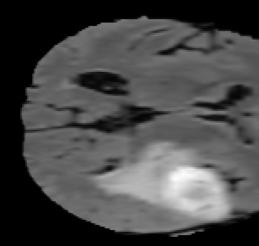

Output(Model prediction for segmentation of tumor regions in brain MRI scans.):

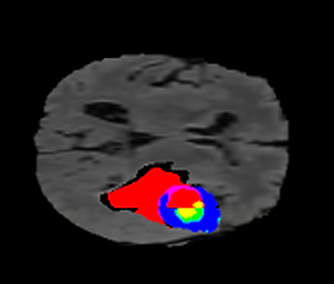

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!cp -r '/content/gdrive/MyDrive/BraTS-Data' ./
!cp /content/gdrive/MyDrive/model_pretrained.hdf5 ./

#data_viz&functions

In [ ]:
%%writefile util.py 
import cv2
import h5py
import imageio
import keras
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from IPython.display import Image
from keras import backend as K
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import (
    Activation,
    Conv3D,
    Conv3DTranspose,
    MaxPooling3D,
    UpSampling3D,
    concatenate
)
from keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.compat.v1.logging import INFO, set_verbosity

set_verbosity(INFO)

K.set_image_data_format("channels_first")


def plot_image_grid(image):
    data_all = []

    data_all.append(image)

    fig, ax = plt.subplots(3, 6, figsize=[16, 9])

    # coronal plane
    coronal = np.transpose(data_all, [1, 3, 2, 4, 0])
    coronal = np.rot90(coronal, 1)

    # transversal plane
    transversal = np.transpose(data_all, [2, 1, 3, 4, 0])
    transversal = np.rot90(transversal, 2)

    # sagittal plane
    sagittal = np.transpose(data_all, [2, 3, 1, 4, 0])
    sagittal = np.rot90(sagittal, 1)

    for i in range(6):
        n = np.random.randint(coronal.shape[2])
        ax[0][i].imshow(np.squeeze(coronal[:, :, n, :]))
        ax[0][i].set_xticks([])
        ax[0][i].set_yticks([])
        if i == 0:
            ax[0][i].set_ylabel('Coronal', fontsize=15)

    for i in range(6):
        n = np.random.randint(transversal.shape[2])
        ax[1][i].imshow(np.squeeze(transversal[:, :, n, :]))
        ax[1][i].set_xticks([])
        ax[1][i].set_yticks([])
        if i == 0:
            ax[1][i].set_ylabel('Transversal', fontsize=15)

    for i in range(6):
        n = np.random.randint(sagittal.shape[2])
        ax[2][i].imshow(np.squeeze(sagittal[:, :, n, :]))
        ax[2][i].set_xticks([])
        ax[2][i].set_yticks([])
        if i == 0:
            ax[2][i].set_ylabel('Sagittal', fontsize=15)

    fig.subplots_adjust(wspace=0, hspace=0)


def visualize_data_gif(data_):
    images = []
    for i in range(data_.shape[0]):
        x = data_[min(i, data_.shape[0] - 1), :, :]
        y = data_[:, min(i, data_.shape[1] - 1), :]
        z = data_[:, :, min(i, data_.shape[2] - 1)]
        img = np.concatenate((x, y, z), axis=1)
        images.append(img)
    imageio.mimsave("/tmp/gif.gif", images, duration=0.01)
    return Image(filename="/tmp/gif.gif", format='png')


# Some code was borrowed from:
# https://github.com/ellisdg/3DUnetCNN/blob/master/unet3d/


def create_convolution_block(input_layer, n_filters, batch_normalization=False,
                             kernel=(3, 3, 3), activation=None,
                             padding='same', strides=(1, 1, 1),
                             instance_normalization=False):
    """
    :param strides:
    :param input_layer:
    :param n_filters:
    :param batch_normalization:
    :param kernel:
    :param activation: Keras activation layer to use. (default is 'relu')
    :param padding:
    :return:
    """
    layer = Conv3D(n_filters, kernel, padding=padding, strides=strides)(
        input_layer)
    if activation is None:
        return Activation('relu')(layer)
    else:
        return activation()(layer)


def get_up_convolution(n_filters, pool_size, kernel_size=(2, 2, 2),
                       strides=(2, 2, 2),
                       deconvolution=False):
    if deconvolution:
        return Deconvolution3D(filters=n_filters, kernel_size=kernel_size,
                               strides=strides)
    else:
        return UpSampling3D(size=pool_size)


def unet_model_3d(loss_function, input_shape=(4, 160, 160, 16),
                  pool_size=(2, 2, 2), n_labels=3,
                  initial_learning_rate=0.00001,
                  deconvolution=False, depth=4, n_base_filters=32,
                  include_label_wise_dice_coefficients=False, metrics=[],
                  batch_normalization=False, activation_name="sigmoid"):
    """
    Builds the 3D UNet Keras model.f
    :param metrics: List metrics to be calculated during model training (default is dice coefficient).
    :param include_label_wise_dice_coefficients: If True and n_labels is greater than 1, model will report the dice
    coefficient for each label as metric.
    :param n_base_filters: The number of filters that the first layer in the convolution network will have. Following
    layers will contain a multiple of this number. Lowering this number will likely reduce the amount of memory required
    to train the model.
    :param depth: indicates the depth of the U-shape for the model. The greater the depth, the more max pooling
    layers will be added to the model. Lowering the depth may reduce the amount of memory required for training.
    :param input_shape: Shape of the input data (n_chanels, x_size, y_size, z_size). The x, y, and z sizes must be
    divisible by the pool size to the power of the depth of the UNet, that is pool_size^depth.
    :param pool_size: Pool size for the max pooling operations.
    :param n_labels: Number of binary labels that the model is learning.
    :param initial_learning_rate: Initial learning rate for the model. This will be decayed during training.
    :param deconvolution: If set to True, will use transpose convolution(deconvolution) instead of up-sampling. This
    increases the amount memory required during training.
    :return: Untrained 3D UNet Model
    """
    inputs = Input(input_shape)
    current_layer = inputs
    levels = list()

    # add levels with max pooling
    for layer_depth in range(depth):
        layer1 = create_convolution_block(input_layer=current_layer,
                                          n_filters=n_base_filters * (
                                                  2 ** layer_depth),
                                          batch_normalization=batch_normalization)
        layer2 = create_convolution_block(input_layer=layer1,
                                          n_filters=n_base_filters * (
                                                  2 ** layer_depth) * 2,
                                          batch_normalization=batch_normalization)
        if layer_depth < depth - 1:
            current_layer = MaxPooling3D(pool_size=pool_size)(layer2)
            levels.append([layer1, layer2, current_layer])
        else:
            current_layer = layer2
            levels.append([layer1, layer2])

    # add levels with up-convolution or up-sampling
    for layer_depth in range(depth - 2, -1, -1):
        up_convolution = get_up_convolution(pool_size=pool_size,
                                            deconvolution=deconvolution,
                                            n_filters=
                                            current_layer._keras_shape[1])(
            current_layer)
        concat = concatenate([up_convolution, levels[layer_depth][1]], axis=1)
        current_layer = create_convolution_block(
            n_filters=levels[layer_depth][1]._keras_shape[1],
            input_layer=concat, batch_normalization=batch_normalization)
        current_layer = create_convolution_block(
            n_filters=levels[layer_depth][1]._keras_shape[1],
            input_layer=current_layer,
            batch_normalization=batch_normalization)

    final_convolution = Conv3D(n_labels, (1, 1, 1))(current_layer)
    act = Activation(activation_name)(final_convolution)
    model = Model(inputs=inputs, outputs=act)

    if not isinstance(metrics, list):
        metrics = [metrics]

    model.compile(optimizer=Adam(lr=initial_learning_rate), loss=loss_function,
                  metrics=metrics)
    return model


def visualize_patch(X, y):
    fig, ax = plt.subplots(1, 2, figsize=[10, 5], squeeze=False)

    ax[0][0].imshow(X[:, :, 0], cmap='Greys_r')
    ax[0][0].set_yticks([])
    ax[0][0].set_xticks([])
    ax[0][1].imshow(y[:, :, 0], cmap='Greys_r')
    ax[0][1].set_xticks([])
    ax[0][1].set_yticks([])

    fig.subplots_adjust(wspace=0, hspace=0)


class VolumeDataGenerator(keras.utils.Sequence):
    def __init__(self,
                 sample_list,
                 base_dir,
                 batch_size=1,
                 shuffle=True,
                 dim=(160, 160, 16),
                 num_channels=4,
                 num_classes=3,
                 verbose=1):
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.base_dir = base_dir
        self.dim = dim
        self.num_channels = num_channels
        self.num_classes = num_classes
        self.verbose = verbose
        self.sample_list = sample_list
        self.on_epoch_end()

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.sample_list))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.sample_list) / self.batch_size))

    def __data_generation(self, list_IDs_temp):
        'Generates data containing batch_size samples'

        # Initialization
        X = np.zeros((self.batch_size, self.num_channels, *self.dim),
                     dtype=np.float64)
        y = np.zeros((self.batch_size, self.num_classes, *self.dim),
                     dtype=np.float64)

        # Generate data
        for i, ID in enumerate(list_IDs_temp):
            # Store sample
            if self.verbose == 1:
                print("Training on: %s" % self.base_dir + ID)
            with h5py.File(self.base_dir + ID, 'r') as f:
                X[i] = np.array(f.get("x"))
                # remove the background class
                y[i] = np.moveaxis(np.array(f.get("y")), 3, 0)[1:]
        return X, y

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[
                  index * self.batch_size: (index + 1) * self.batch_size]
        # Find list of IDs
        sample_list_temp = [self.sample_list[k] for k in indexes]
        # Generate data
        X, y = self.__data_generation(sample_list_temp)

        return X, y


def get_labeled_image(image, label, is_categorical=False):
    if not is_categorical:
        label = to_categorical(label, num_classes=4).astype(np.uint8)

    image = cv2.normalize(image[:, :, :, 0], None, alpha=0, beta=255,
                          norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F).astype(
        np.uint8)

    labeled_image = np.zeros_like(label[:, :, :, 1:])

    # remove tumor part from image
    labeled_image[:, :, :, 0] = image * (label[:, :, :, 0])
    labeled_image[:, :, :, 1] = image * (label[:, :, :, 0])
    labeled_image[:, :, :, 2] = image * (label[:, :, :, 0])

    # color labels
    labeled_image += label[:, :, :, 1:] * 255
    return labeled_image


def predict_and_viz(image, label, model, threshold, loc=(100, 100, 50)):
    image_labeled = get_labeled_image(image.copy(), label.copy())

    model_label = np.zeros([3, 320, 320, 160])

    for x in range(0, image.shape[0], 160):
        for y in range(0, image.shape[1], 160):
            for z in range(0, image.shape[2], 16):
                patch = np.zeros([4, 160, 160, 16])
                p = np.moveaxis(image[x: x + 160, y: y + 160, z:z + 16], 3, 0)
                patch[:, 0:p.shape[1], 0:p.shape[2], 0:p.shape[3]] = p
                pred = model.predict(np.expand_dims(patch, 0))
                model_label[:, x:x + p.shape[1],
                y:y + p.shape[2],
                z: z + p.shape[3]] += pred[0][:, :p.shape[1], :p.shape[2],
                                      :p.shape[3]]

    model_label = np.moveaxis(model_label[:, 0:240, 0:240, 0:155], 0, 3)
    model_label_reformatted = np.zeros((240, 240, 155, 4))

    model_label_reformatted = to_categorical(label, num_classes=4).astype(
        np.uint8)

    model_label_reformatted[:, :, :, 1:4] = model_label

    model_labeled_image = get_labeled_image(image, model_label_reformatted,
                                            is_categorical=True)

    fig, ax = plt.subplots(2, 3, figsize=[10, 7])

    # plane values
    x, y, z = loc

    ax[0][0].imshow(np.rot90(image_labeled[x, :, :, :]))
    ax[0][0].set_ylabel('Ground Truth', fontsize=15)
    ax[0][0].set_xlabel('Sagital', fontsize=15)

    ax[0][1].imshow(np.rot90(image_labeled[:, y, :, :]))
    ax[0][1].set_xlabel('Coronal', fontsize=15)

    ax[0][2].imshow(np.squeeze(image_labeled[:, :, z, :]))
    ax[0][2].set_xlabel('Transversal', fontsize=15)

    ax[1][0].imshow(np.rot90(model_labeled_image[x, :, :, :]))
    ax[1][0].set_ylabel('Prediction', fontsize=15)

    ax[1][1].imshow(np.rot90(model_labeled_image[:, y, :, :]))
    ax[1][2].imshow(model_labeled_image[:, :, z, :])

    fig.subplots_adjust(wspace=0, hspace=.12)

    for i in range(2):
        for j in range(3):
            ax[i][j].set_xticks([])
            ax[i][j].set_yticks([])

    return model_label_reformatted


Writing util.py


In [ ]:
import keras
import json
import numpy as np
import pandas as pd
import nibabel as nib
import matplotlib.pyplot as plt
from tensorflow.keras import backend as K 

import util

import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [ ]:
#Magnetic resonance imaging (MRI) is an advanced imaging technique that is used 
#to observe a variety of diseases and parts of the body.

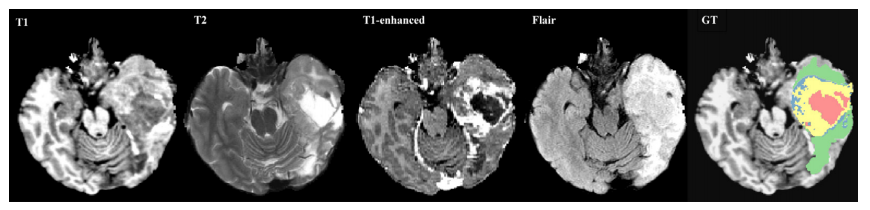

In [ ]:
from IPython.display import Image
Image(filename='/content/1.png')

In [ ]:
# The DICOM format is the output format for most commercial MRI scanners. 
# This type of data can be processed using the pydicom Python library.

In [ ]:
# 1.3 Exploring the Dataset
# Our dataset is stored in the NifTI-1 format and we will be using the NiBabel library to interact with the files.
# Each training sample is composed of two separate files:

# The first file is an image file containing a 4D array of MR image in the shape of (240, 240, 155, 4).

# The first 3 dimensions are the X, Y, and Z values for each point in the 3D volume, which is commonly called a voxel.
# The 4th dimension is the values for 4 different sequences

# 0: FLAIR: "Fluid Attenuated Inversion Recovery" (FLAIR)
# 1: T1w: "T1-weighted"
# 2: t1gd: "T1-weighted with gadolinium contrast enhancement" (T1-Gd)
# 3: T2w: "T2-weighted"
# The second file in each training example is a label file containing a 3D array with the shape of (240, 240, 155).

# The integer values in this array indicate the "label" for each voxel in the corresponding image files:
# 0: background
# 1: edema
# 2: non-enhancing tumor
# 3: enhancing tumor
# We have access to a total of 484 training images which we will be splitting into a training (80%) and validation (20%) dataset.

In [ ]:
# set home directory and data directory
HOME_DIR = "/content/BraTS-Data/"
DATA_DIR = HOME_DIR
def load_case(image_nifty_file, label_nifty_file):
    image = np.array(nib.load(image_nifty_file).get_fdata())
    label = np.array(nib.load(label_nifty_file).get_fdata()) 
    return image, label

In [ ]:
# The colors correspond to each class.
# Red is edema
# Green is a non-enhancing tumor
# Blue is an enhancing tumor.

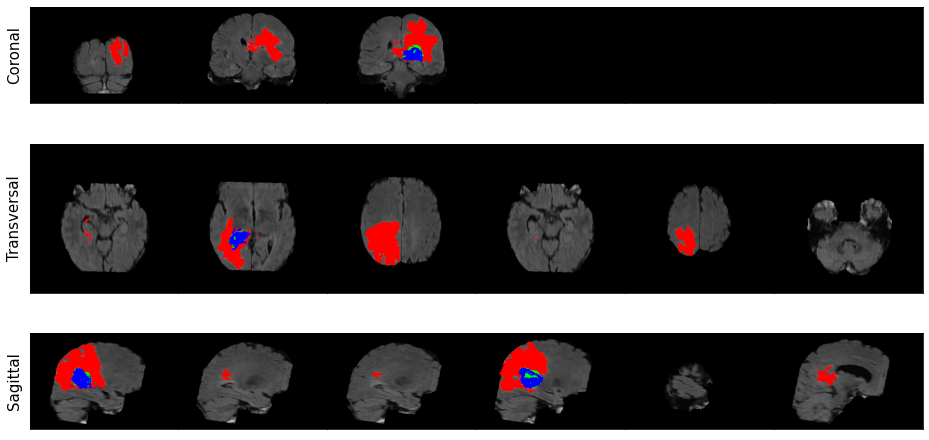

In [ ]:
image, label = load_case(DATA_DIR + "imagesTr/BRATS_003.nii.gz", DATA_DIR + "labelsTr/BRATS_003.nii.gz")
image = util.get_labeled_image(image, label)
util.plot_image_grid(image)

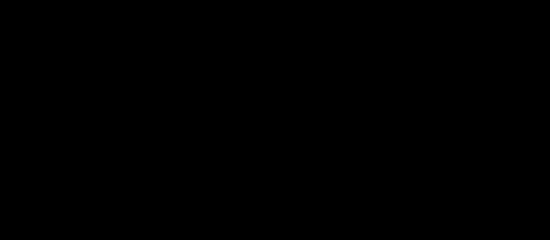

In [ ]:
image, label = load_case(DATA_DIR + "imagesTr/BRATS_003.nii.gz", DATA_DIR + "labelsTr/BRATS_003.nii.gz")
util.visualize_data_gif(util.get_labeled_image(image, label))

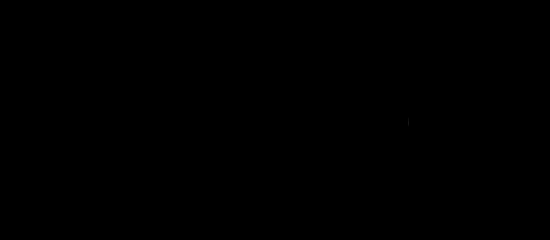

In [ ]:
image, label = load_case(DATA_DIR + "imagesTr/BRATS_002.nii.gz", DATA_DIR + "labelsTr/BRATS_002.nii.gz")
util.visualize_data_gif(util.get_labeled_image(image, label))

#Data_preprocessing

In [ ]:
# Data Preprocessing using patches
# While our dataset is provided to us post-registration and in the NIfTI format, 
# we still have to do some minor pre-processing before feeding the data to our model.

# Generate sub-volumes
# We are going to first generate "patches" of our data which you can think of as sub-volumes 
# of the whole MR images.

# The reason that we are generating patches is because a network that can process the entire volume
# at once will simply not fit inside our current environment's memory/GPU.
# Therefore we will be using this common technique to generate spatially consistent sub-volumes of our data, 
# which can be fed into our network.
# Specifically, we will be generating randomly sampled sub-volumes of shape [160, 160, 16] from our images.
# Furthermore, given that a large portion of the MRI volumes are just brain tissue or 
# black background without any tumors, we want to make sure that we pick patches that 
# at least include some amount of tumor data.
# Therefore, we are only going to pick patches that have at most 95% non-tumor regions (so at least 5% tumor).
# We do this by filtering the volumes based on the values present in the background labels.

# Standardization (mean 0, stdev 1)
# Lastly, given that the values in MR images cover a very wide range, 
# we will standardize the values to have a mean of zero and standard deviation of 1.

In [ ]:
# Sub-volume Sampling
# Fill in the function below takes in:

# a 4D image (shape: [240, 240, 155, 4])
# its 3D label (shape: [240, 240, 155]) arrays,

# The function returns:
# A randomly generated sub-volume of size [160, 160, 16]
# Its corresponding label in a 1-hot format which has the shape [3, 160, 160, 16]

# Additionally:

# Make sure that at most 95% of the returned patch is non-tumor regions.
# Given that our network expects the channels for our images to appear as the first dimension 
# (instead of the last one in our current setting) reorder the dimensions of the image to 
# have the channels appear as the first dimension.
# Reorder the dimensions of the label array to have the first dimension as the classes 
# (instead of the last one in our current setting)
# Reduce the labels array dimension to only include the non-background classes (total of 3 instead of 4)

# Hints
# To check the ratio of background to the whole sub-volume, 
# the numerator is the number of background labels in the sub-volume. 
# The last dimension of the label array at index 0 contains the labels to identify whether 
# the voxel is a background (value of 1) or not a a background (value of 0).
# For the denominator of the background ratio, this is the volume of the output
#  (see output_x, output_y, output_z in the function parameters).
# When taking a subset of the label 'y' that excludes the background class, 
# remember which dimension contains the 'num_classes' channel after re-ordering the axes.

In [ ]:
def get_sub_volume(image, label, 
                   orig_x = 240, orig_y = 240, orig_z = 155, 
                   output_x = 160, output_y = 160, output_z = 16,
                   num_classes = 4, max_tries = 1000, 
                   background_threshold=0.95):
    """
    Extract random sub-volume from original images.

    Args:
        image (np.array): original image, 
            of shape (orig_x, orig_y, orig_z, num_channels)
        label (np.array): original label. 
            labels coded using discrete values rather than
            a separate dimension, 
            so this is of shape (orig_x, orig_y, orig_z)
        orig_x (int): x_dim of input image
        orig_y (int): y_dim of input image
        orig_z (int): z_dim of input image
        output_x (int): desired x_dim of output
        output_y (int): desired y_dim of output
        output_z (int): desired z_dim of output
        num_classes (int): number of class labels
        max_tries (int): maximum trials to do when sampling
        background_threshold (float): limit on the fraction 
            of the sample which can be the background

    returns:
        X (np.array): sample of original image of dimension 
            (num_channels, output_x, output_y, output_z)
        y (np.array): labels which correspond to X, of dimension 
            (num_classes, output_x, output_y, output_z)
    """
    X = None
    y = None
    tries = 0
    while tries < max_tries:
        start_x = np.random.randint(0 , orig_x - output_x + 1)
        start_y = np.random.randint(0 , orig_y - output_y + 1)
        start_z = np.random.randint(0 , orig_z - output_z + 1)
        y = label[start_x: start_x + output_x,
                  start_y: start_y + output_y,
                  start_z: start_z + output_z]
        y = keras.utils.to_categorical(y, num_classes = num_classes)
        bgrd_ratio = np.sum(y[:,:,:,0]) / (output_x * output_y * output_z)
        tries += 1
        if bgrd_ratio < background_threshold:
            X = np.copy(image[start_x: start_x + output_x,
                              start_y: start_y + output_y,
                              start_z: start_z + output_z, :])
            X = np.moveaxis(X,3,0)
            y = y[1:, :, :, :]
    
            return X, y
    print(f"Tried {tries} times to find a sub-volume. Giving up...")

In [ ]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
def get_sub_volume(image, label, 
                   orig_x = 240, orig_y = 240, orig_z = 155, 
                   output_x = 160, output_y = 160, output_z = 16,
                   num_classes = 4, max_tries = 1000, 
                   background_threshold=0.95):
    """
    Extract random sub-volume from original images.

    Args:
        image (np.array): original image, 
            of shape (orig_x, orig_y, orig_z, num_channels)
        label (np.array): original label. 
            labels coded using discrete values rather than
            a separate dimension, 
            so this is of shape (orig_x, orig_y, orig_z)
        orig_x (int): x_dim of input image
        orig_y (int): y_dim of input image
        orig_z (int): z_dim of input image
        output_x (int): desired x_dim of output
        output_y (int): desired y_dim of output
        output_z (int): desired z_dim of output
        num_classes (int): number of class labels
        max_tries (int): maximum trials to do when sampling
        background_threshold (float): limit on the fraction 
            of the sample which can be the background

    returns:
        X (np.array): sample of original image of dimension 
            (num_channels, output_x, output_y, output_z)
        y (np.array): labels which correspond to X, of dimension 
            (num_classes, output_x, output_y, output_z)
    """
    # Initialize features and labels with `None`
    X = None
    y = None

    ### START CODE HERE (REPLACE INSTANCES OF 'None' with your code) ###
    
    tries = 0
    
    while tries < max_tries:
        # randomly sample sub-volume by sampling the corner voxel
        # hint: make sure to leave enough room for the output dimensions!
        start_x = np.random.randint(0, orig_x - output_x+1)
        start_y = np.random.randint(0, orig_y - output_y+1)
        start_z = np.random.randint(0, orig_z - output_z+1)

        # extract relevant area of label
        y = label[start_x: start_x + output_x,
                  start_y: start_y + output_y,
                  start_z: start_z + output_z]
        
        # One-hot encode the categories.
        # This adds a 4th dimension, 'num_classes'
        # (output_x, output_y, output_z, num_classes)
        y = keras.utils.to_categorical(y, num_classes=num_classes)

        # compute the background ratio
        bgrd_ratio = np.sum(y[:, :, :, 0])/(output_x * output_y * output_z)

        # increment tries counter
        tries += 1

        # if background ratio is below the desired threshold,
        # use that sub-volume.
        # otherwise continue the loop and try another random sub-volume
        if bgrd_ratio < background_threshold:

            # make copy of the sub-volume
            X = np.copy(image[start_x: start_x + output_x,
                              start_y: start_y + output_y,
                              start_z: start_z + output_z, :])
            
            # change dimension of X
            # from (x_dim, y_dim, z_dim, num_channels)
            # to (num_channels, x_dim, y_dim, z_dim)
            X = np.moveaxis(X, 3, 0)

            # change dimension of y
            # from (x_dim, y_dim, z_dim, num_classes)
            # to (num_classes, x_dim, y_dim, z_dim)
            y = np.moveaxis(y, 3, 0)

            ### END CODE HERE ###
            
            # take a subset of y that excludes the background class
            # in the 'num_classes' dimension
            y = y[1:, :, :, :]
    
            return X, y

    # if we've tried max_tries number of samples
    # Give up in order to avoid looping forever.
    print(f"Tried {tries} times to find a sub-volume. Giving up...")

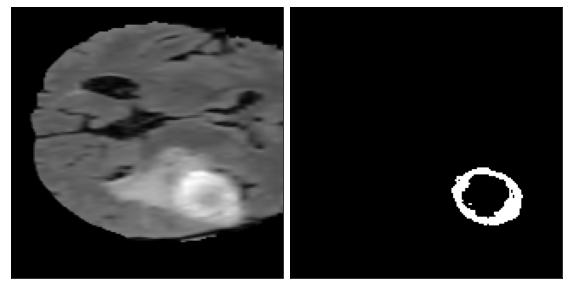

In [ ]:
image, label = load_case(DATA_DIR + "imagesTr/BRATS_001.nii.gz", DATA_DIR + "labelsTr/BRATS_001.nii.gz")
X, y = get_sub_volume(image, label)
util.visualize_patch(X[0, :, :, :], y[2])

In [ ]:
def standardize(image):
    """
    Standardize mean and standard deviation 
        of each channel and z_dimension.

    Args:
        image (np.array): input image, 
            shape (num_channels, dim_x, dim_y, dim_z)

    Returns:
        standardized_image (np.array): standardized version of input image
    """
    standardized_image = np.zeros(image.shape)
    for c in range(image.shape[0]):
        for z in range(image.shape[3]):
            image_slice = image[c,:,:,z]
            centered = image_slice - np.mean(image_slice)
            centered_scaled = centered / np.std(centered)
            standardized_image[c, :, :, z] = centered_scaled
    return standardized_image

In [ ]:
X_norm = standardize(X)
print("standard deviation for a slice should be 1.0")
print(f"stddv for X_norm[0, :, :, 0]: {X_norm[0,:,:,0].std():.2f}")

standard deviation for a slice should be 1.0
stddv for X_norm[0, :, :, 0]: 1.00


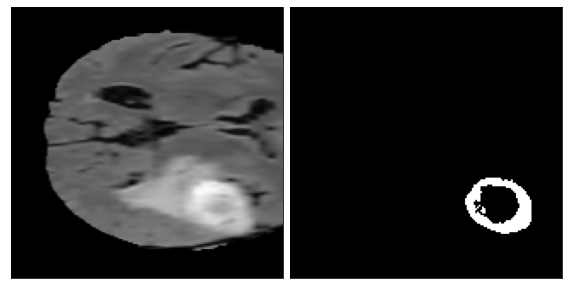

In [ ]:
util.visualize_patch(X_norm[0, :, :, :], y[2])

#Metrics

In [ ]:
# Dice Similarity Coefficient

# The Dice index ranges from 0 (complete mismatch)
# To 1 (perfect match).
# In general, for two sets A and B, the Dice similarity coefficient is defined as:

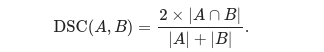

In [ ]:
from IPython.display import Image
Image(filename='/content/dsc.png')

In [ ]:
# Here we can interpret  A and B as sets of voxels,  being the predicted tumor region and  
# being the ground truth.

# Our model will map each voxel to 0 or 1

# 0 means it is a background voxel
# 1 means it is part of the segmented region.
# In the dice coefficient, the variables in the formula are:

#  x : the input image
#  f(x): the model output (prediction)
#  y : the label (actual ground truth)
# The dice coefficient "DSC" is:

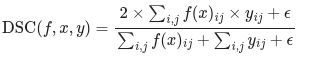

In [ ]:
from IPython.display import Image
Image(filename='/content/d.png')

In [ ]:
def single_class_dice_coefficient(y_true, y_pred, axis=(0, 1, 2), 
                                  epsilon=0.00001):
    """
    Compute dice coefficient for single class.

    Args:
        y_true (Tensorflow tensor): tensor of ground truth values for single class.
                                    shape: (x_dim, y_dim, z_dim)
        y_pred (Tensorflow tensor): tensor of predictions for single class.
                                    shape: (x_dim, y_dim, z_dim)
        axis (tuple): spatial axes to sum over when computing numerator and
                      denominator of dice coefficient.
                      Hint: pass this as the 'axis' argument to the K.sum function.
        epsilon (float): small constant added to numerator and denominator to
                        avoid divide by 0 errors.
    Returns:
        dice_coefficient (float): computed value of dice coefficient.     
    """
    
    dice_numerator = 2 * np.sum(y_true * y_pred, axis = axis) + epsilon
    dice_denominator = K.sum(y_true,axis= axis) + K.sum(y_pred, axis= axis) + epsilon
    dice_coefficient = dice_numerator / dice_denominator

    return dice_coefficient

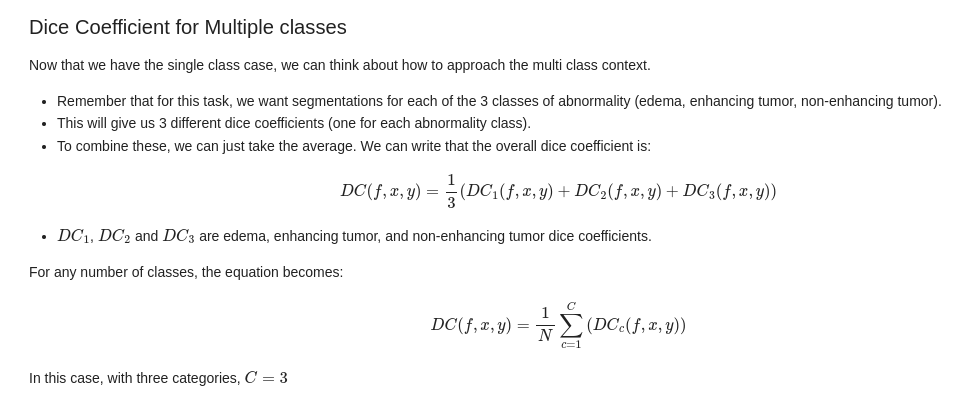

In [ ]:
from IPython.display import Image
Image(filename='/content/dmc.png')

In [ ]:
def dice_coefficient(y_true, y_pred, axis=(1, 2, 3), 
                     epsilon=0.00001):
    """
    Compute mean dice coefficient over all abnormality classes.

    Args:
        y_true (Tensorflow tensor): tensor of ground truth values for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        y_pred (Tensorflow tensor): tensor of predictions for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        axis (tuple): spatial axes to sum over when computing numerator and
                      denominator of dice coefficient.
                      Hint: pass this as the 'axis' argument to the K.sum
                            and K.mean functions.
        epsilon (float): small constant add to numerator and denominator to
                        avoid divide by 0 errors.
    Returns:
        dice_coefficient (float): computed value of dice coefficient.     
    """
    dice_numerator = 2 * K.sum(y_true * y_pred , axis = axis) + epsilon
    dice_denominator = K.sum(y_true, axis = axis ) + K.sum(y_pred, axis = axis) + epsilon
    dice_coefficient = K.mean(dice_numerator/dice_denominator)

    return dice_coefficient

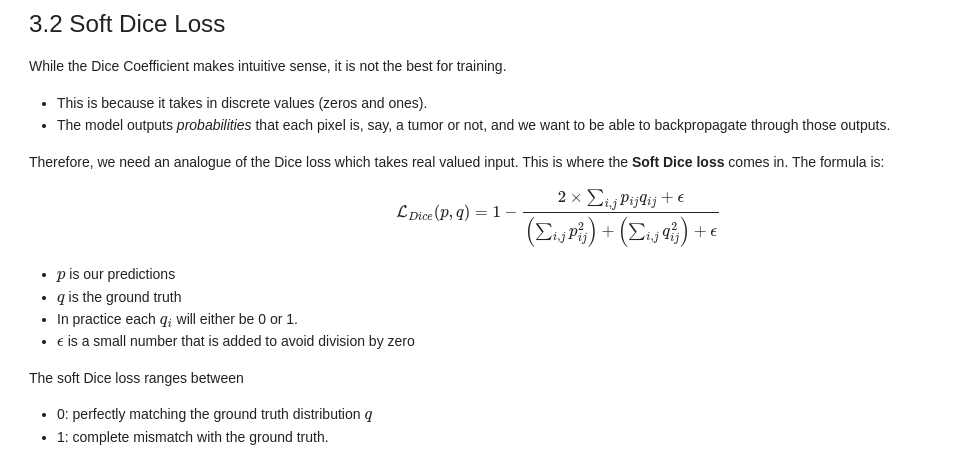

In [ ]:
from IPython.display import Image
Image(filename='/content/s.png')

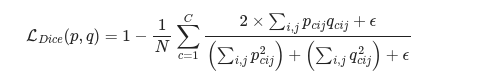

In [ ]:
#Multi-Class Soft Dice Loss
from IPython.display import Image
Image(filename='/content/f.png')

In [ ]:
def soft_dice_loss(y_true, y_pred, axis=(1, 2, 3), 
                   epsilon=0.00001):
    """
    Compute mean soft dice loss over all abnormality classes.

    Args:
        y_true (Tensorflow tensor): tensor of ground truth values for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        y_pred (Tensorflow tensor): tensor of soft predictions for all classes.
                                    shape: (num_classes, x_dim, y_dim, z_dim)
        axis (tuple): spatial axes to sum over when computing numerator and
                      denominator in formula for dice loss.
                      Hint: pass this as the 'axis' argument to the K.sum
                            and K.mean functions.
        epsilon (float): small constant added to numerator and denominator to
                        avoid divide by 0 errors.
    Returns:
        dice_loss (float): computed value of dice loss.     
    """
    dice_numerator = 2 * K.sum(y_true * y_pred , axis= axis) + epsilon
    dice_denominator = K.sum(y_true ** 2, axis= axis) + K.sum(y_pred ** 2 , axis = axis) + epsilon
    dice_loss = 1 - K.mean(dice_numerator / dice_denominator)
    return dice_loss

#Create and Train the model

In [ ]:
model = util.unet_model_3d(loss_function=soft_dice_loss, metrics=[dice_coefficient])

/usr/local/lib/python3.8/dist-packages/keras/optimizers/optimizer_v2/adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [ ]:
# We have pre-processed the entire dataset into patches and stored the patches in the h5py format.

In [ ]:
base_dir = HOME_DIR + "processed/"
with open(base_dir + "config.json") as json_file:
    config = json.load(json_file)
train_generator = util.VolumeDataGenerator(config["train"], base_dir + "train/", batch_size=3, dim=(160, 160, 16), verbose=0)
valid_generator = util.VolumeDataGenerator(config["valid"], base_dir + "valid/", batch_size=3, dim=(160, 160, 16), verbose=0)

steps_per_epoch = 20
n_epochs=10
validation_steps = 20

model.fit_generator(generator=train_generator,
        steps_per_epoch=steps_per_epoch,
        epochs=n_epochs,
        use_multiprocessing=True,
        validation_data=valid_generator,
        validation_steps=validation_steps)
#model.save_weights(base_dir + 'my_model_pretrained.hdf5')

In [ ]:
#loading_pretrained_model
base_dir = HOME_DIR + "processed/"
with open(base_dir + "config.json") as json_file:
    config = json.load(json_file)
# Get generators for training and validation sets
train_generator = util.VolumeDataGenerator(config["train"], base_dir + "train/", batch_size=3, dim=(160, 160, 16), verbose=0)
valid_generator = util.VolumeDataGenerator(config["valid"], base_dir + "valid/", batch_size=3, dim=(160, 160, 16), verbose=0)

In [ ]:
model.load_weights("model_pretrained.hdf5")

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 4, 160, 160  0           []                               
                                , 16)]                                                            
                                                                                                  
 conv3d (Conv3D)                (None, 32, 160, 160  3488        ['input_1[0][0]']                
                                , 16)                                                             
                                                                                                  
 activation (Activation)        (None, 32, 160, 160  0           ['conv3d[0][0]']                 
                                , 16)                                                         

#Evaluation

In [ ]:
val_loss, val_dice = model.evaluate_generator(valid_generator)
print(f"validation soft dice loss: {val_loss:.4f}")
print(f"validation dice coefficient: {val_dice:.4f}")

<ipython-input-58-1d8edcbdad7a>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  val_loss, val_dice = model.evaluate_generator(valid_generator)


validation soft dice loss: 0.4871
validation dice coefficient: 0.5118


In [ ]:
# Patch-level predictions
# When applying the model, we'll want to look at segmentations for individual scans (entire scans, 
# not just the sub-volumes)

# This will be a bit complicated because of our sub-volume approach.
# First let's keep things simple and extract model predictions for sub-volumes.
# We can use the sub-volume which we extracted at the beginning of the assignment.

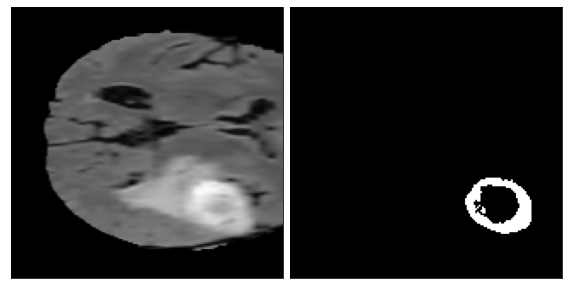

In [ ]:
util.visualize_patch(X_norm[0, :, :, :], y[2])

In [ ]:
# Add a 'batch' dimension
# We can extract predictions by calling model.predict on the patch.

# We'll add an images_per_batch dimension, since the predict method is written to take in batches.
# The dimensions of the input should be (images_per_batch, num_channels, x_dim, y_dim, z_dim).

In [ ]:
X_norm_with_batch_dimension = np.expand_dims(X_norm, axis=0)
patch_pred = model.predict(X_norm_with_batch_dimension)

1/1 [==============================] - 0s 26ms/step


In [ ]:
# Convert prediction from probability into a category
# Currently, each element of patch_pred is a number between 0.0 and 1.0.

# Each number is the model's confidence that a voxel is part of a given class.
# You will convert these to discrete 0 and 1 integers by using a threshold.
# We'll use a threshold of 0.5.
# In real applications, you would tune this to achieve your required level of sensitivity or specificity.

In [ ]:
threshold = 0.5
patch_pred[patch_pred > threshold] = 1.0
patch_pred[patch_pred <= threshold] = 0.0

Patch and ground truth


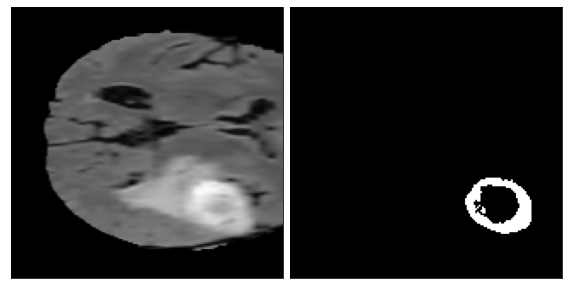

Patch and prediction


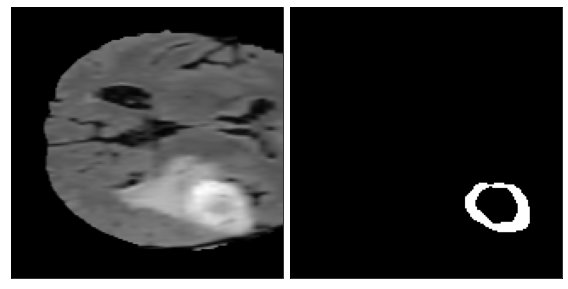

In [ ]:
print("Patch and ground truth")
util.visualize_patch(X_norm[0, :, :, :], y[2])
plt.show()
print("Patch and prediction")
util.visualize_patch(X_norm[0, :, :, :], patch_pred[0, 2, :, :, :])
plt.show()

In [ ]:
# Sensitivity and Specificity
# To quantify its performance, we can use per-pixel sensitivity and specificity.

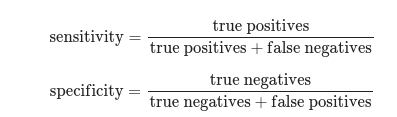

In [ ]:
from IPython.display import Image
Image(filename='/content/f1.png')

In [ ]:
def compute_class_sens_spec(pred, label, class_num):
    """
    Compute sensitivity and specificity for a particular example
    for a given class.

    Args:
        pred (np.array): binary arrary of predictions, shape is
                         (num classes, height, width, depth).
        label (np.array): binary array of labels, shape is
                          (num classes, height, width, depth).
        class_num (int): number between 0 - (num_classes -1) which says
                         which prediction class to compute statistics
                         for.

    Returns:
        sensitivity (float): precision for given class_num.
        specificity (float): recall for given class_num
    """
    class_pred = pred[class_num]
    class_label = label[class_num]
    tp = np.sum( (class_pred == 1) * (class_label == 1))
    # true negatives
    tn = np.sum( (class_pred == 0) * (class_label == 0))
    #false positives
    fp = np.sum( (class_pred == 1) * (class_label == 0))
    # false negatives
    fn = np.sum( (class_pred == 0) * (class_label == 1))
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    return sensitivity, specificity

In [ ]:
# Sensitivity and Specificity for the patch prediction
sensitivity, specificity = compute_class_sens_spec(patch_pred[0], y, 2)
print(f"Sensitivity: {sensitivity:.4f}")
print(f"Specificity: {specificity:.4f}")

Sensitivity: 0.8999
Specificity: 0.9976


In [ ]:
def get_sens_spec_df(pred, label):
    patch_metrics = pd.DataFrame(
        columns = ['Edema', 
                   'Non-Enhancing Tumor', 
                   'Enhancing Tumor'], 
        index = ['Sensitivity',
                 'Specificity'])
    
    for i, class_name in enumerate(patch_metrics.columns):
        sens, spec = compute_class_sens_spec(pred, label, i)
        patch_metrics.loc['Sensitivity', class_name] = round(sens,4)
        patch_metrics.loc['Specificity', class_name] = round(spec,4)

    return patch_metrics

In [ ]:
df = get_sens_spec_df(patch_pred[0], y)
print(df)

              Edema Non-Enhancing Tumor Enhancing Tumor
Sensitivity  0.9668              0.9495          0.8999
Specificity  0.9749              0.9985          0.9976


In [ ]:
# Running on entire scans
# As of now, our model just runs on patches, but what we really want to see is our model's 
# result on a whole MRI scan.

# To do this, generate patches for the scan.
# Then we run the model on the patches.
# Then combine the results together to get a fully labeled MR image.

# The output of our model will be a 4D array with 3 probability values for each voxel in our data.

# We then can use a threshold (which you can find by a calibration process) to decide whether
# or not to report a label for each voxel.

# Inputs: an image, label and model.
# Ouputs: the model prediction over the whole image, and a visual of the ground truth and prediction.

1/1 [==============================] - 0s 26ms/step


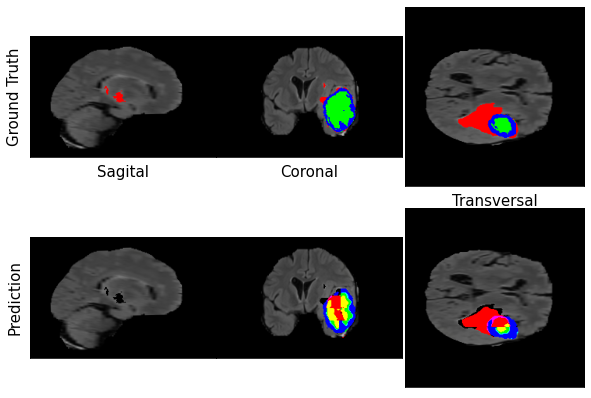

In [ ]:
image, label = load_case(DATA_DIR + "imagesTr/BRATS_001.nii.gz", DATA_DIR + "labelsTr/BRATS_001.nii.gz")
pred = util.predict_and_viz(image, label, model, .5, loc=(130, 130, 77)) 

In [ ]:
# to compute sensitivity and specificity for each class over the whole scan.

In [ ]:
whole_scan_label = keras.utils.to_categorical(label, num_classes = 4)
whole_scan_pred = pred
whole_scan_label = np.moveaxis(whole_scan_label, 3 ,0)[1:4]
whole_scan_pred = np.moveaxis(whole_scan_pred, 3, 0)[1:4]

In [ ]:
whole_scan_df = get_sens_spec_df(whole_scan_pred, whole_scan_label)
print(whole_scan_df)

              Edema Non-Enhancing Tumor Enhancing Tumor
Sensitivity  0.6284              0.6361           0.923
Specificity   0.997              0.9998          0.9925
